In [1]:
%cd ../../

/mnt/sda/otani/Experiments/eval-detection


In [2]:
import neptune.new as neptune
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from mmdet.core.visualization.image import imshow_gt_det_bboxes, imshow_det_bboxes
from mmdet.datasets import build_dataset, get_loading_pipeline
import numpy as np
import json
import os
import mmcv
%matplotlib inline

In [3]:
# run = neptune.init(project=os.environ["NEPTUNE_PROJECT"], run="EV-114", mode="read-only")
c_costs = {}
results = {}
for model_name in ["DETR", "Faster-RCNN", "VFNet", "RetinaNet", "YOLOF"]:
    # run["results/"+model_name].download("tmp/")
    # run["evaluation/otc/per_img/"+model_name].download("tmp/")
    per_img_ccost = json.load(open("tmp/"+model_name+".json"))
    res = mmcv.load("tmp/"+model_name+".pkl")
    c_costs[model_name] = per_img_ccost
    results[model_name] = res
# run.stop()

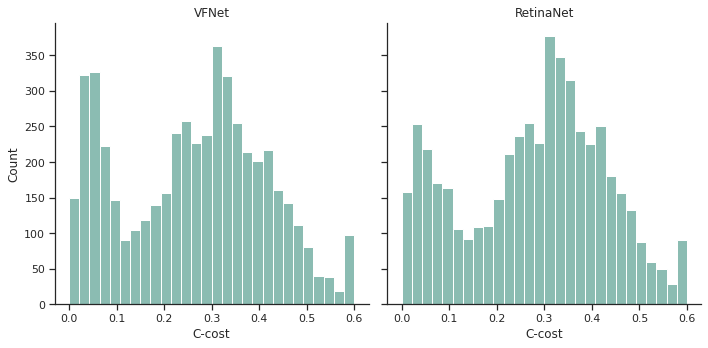

In [4]:
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)
cp = sns.cubehelix_palette(rot=-.4)
data = {"model": [], "C-cost": []}
for k, costs in c_costs.items():
    if k not in ["VFNet", "RetinaNet"]:
        continue
    data["model"] += [k] * len(costs)
    data["C-cost"] += [x[1] for x in costs]
df = pd.DataFrame(data)
g = sns.displot(data=df, x="C-cost", col="model", color=cp[2])
g.set_titles("{col_name}")

In [5]:
cfg = mmcv.Config.fromfile("~/.cache/mim/vfnet_r50_fpn_mstrain_2x_coco.py")
cfg.data.test.test_mode = True
if cfg.get('custom_imports', None):
    from mmcv.utils import import_modules_from_strings
    import_modules_from_strings(**cfg['custom_imports'])

cfg.data.test.pop('samples_per_gpu', 0)
cfg.data.test.pipeline = get_loading_pipeline(cfg.data.train.pipeline)
dataset = build_dataset(cfg.data.test)

loading annotations into memory...
Done (t=0.70s)
creating index...
index created!


In [6]:
sns.color_palette("colorblind")

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

0


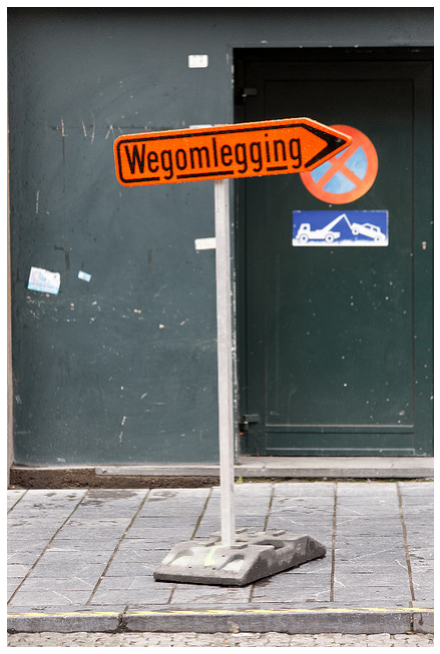

0.02814222127199173


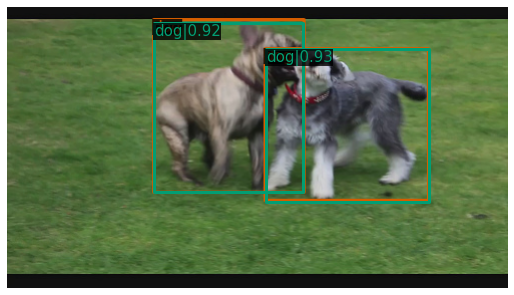

0.04476293921470642


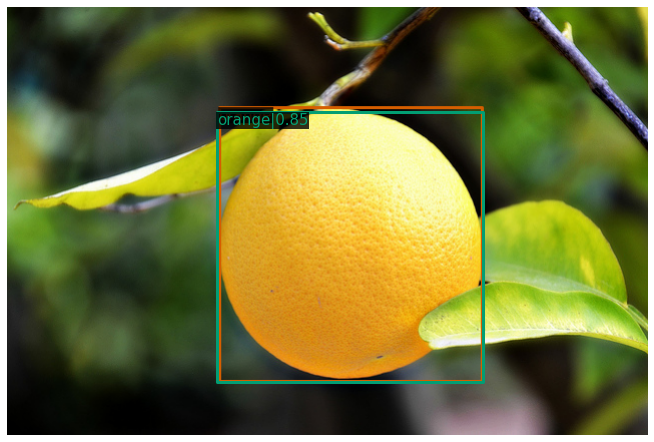

0.06050485670566559


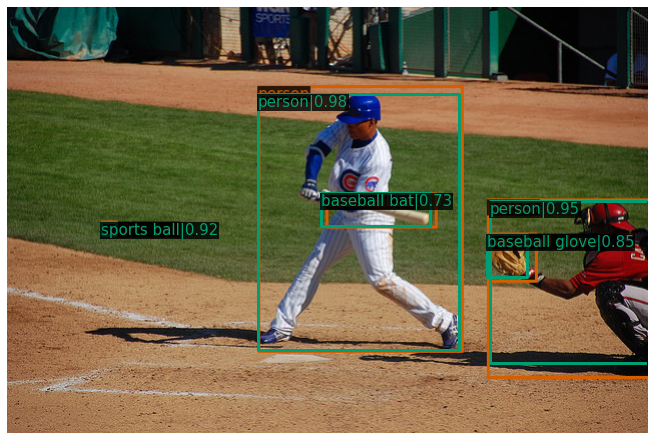

0.08361209183931351


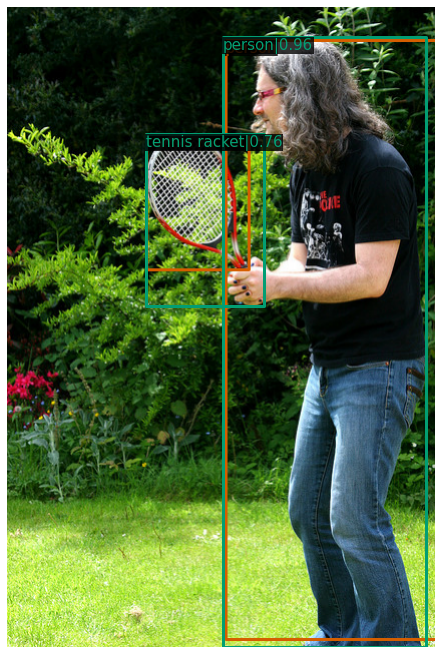

0.1266394754250844


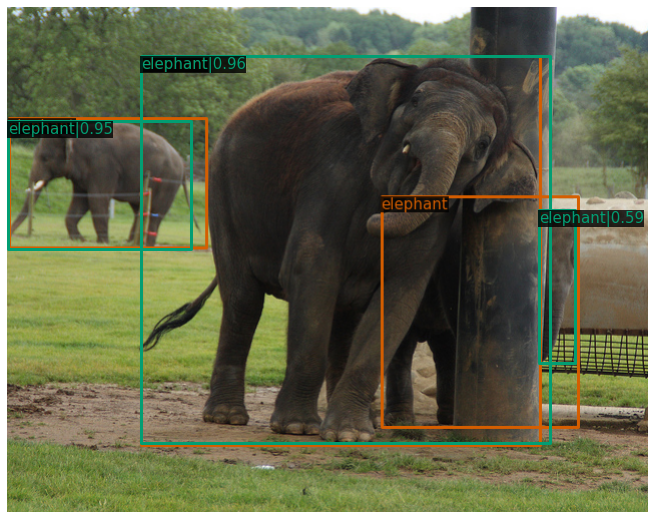

0.1749495878815651


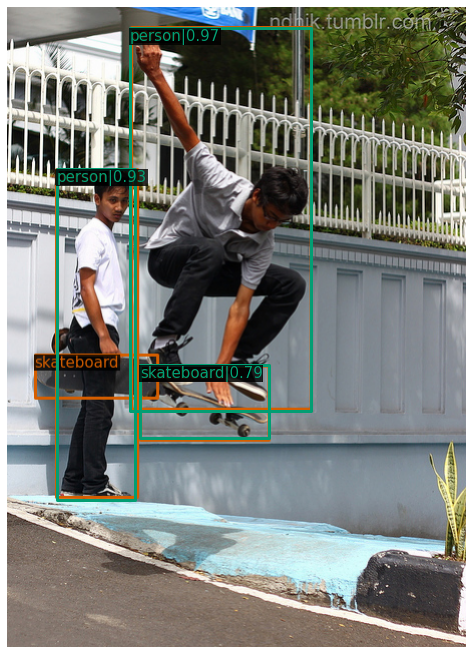

0.21225364463669916


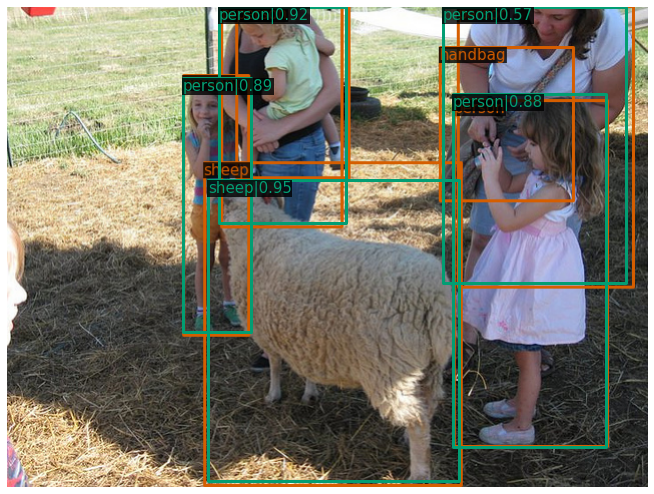

0.23454864110265455


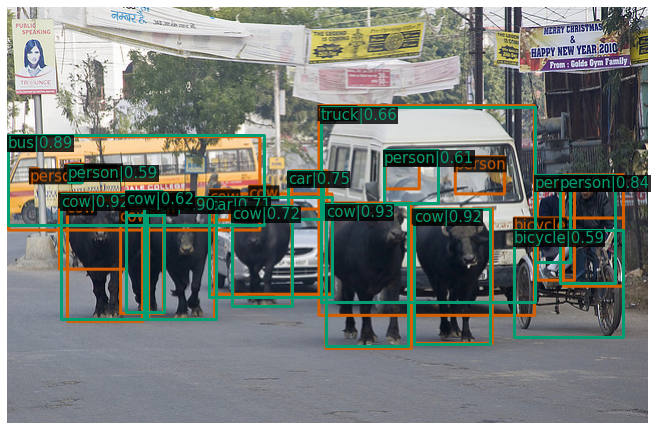

0.2552182247241338


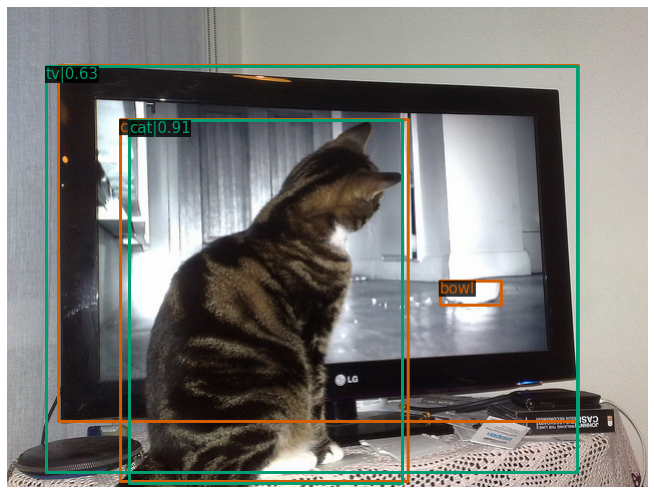

0.2787408103545506


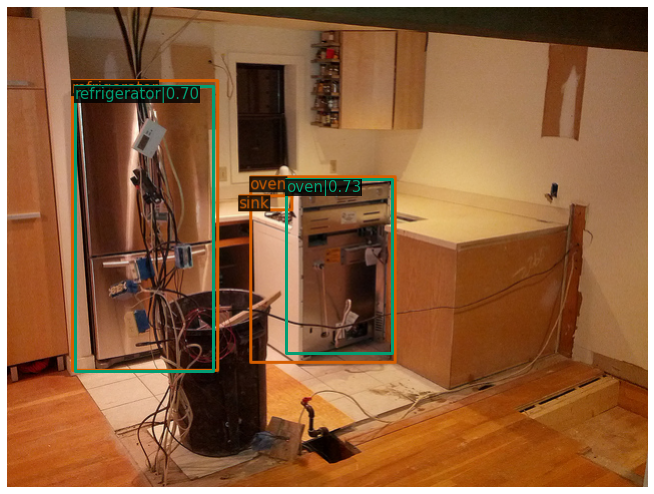

0.30128903885682423


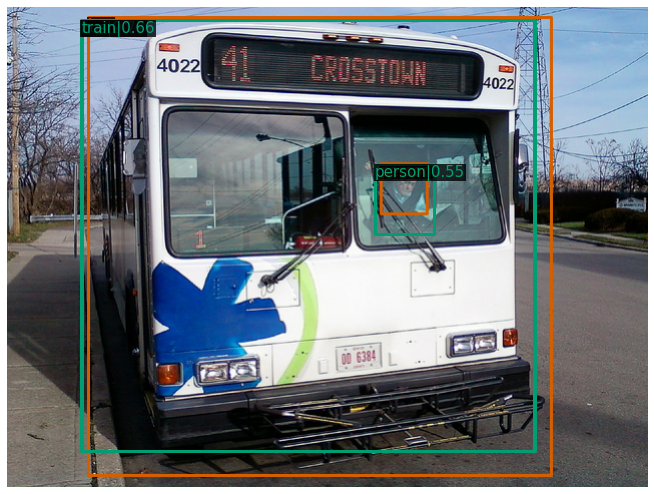

0.3163933718746359


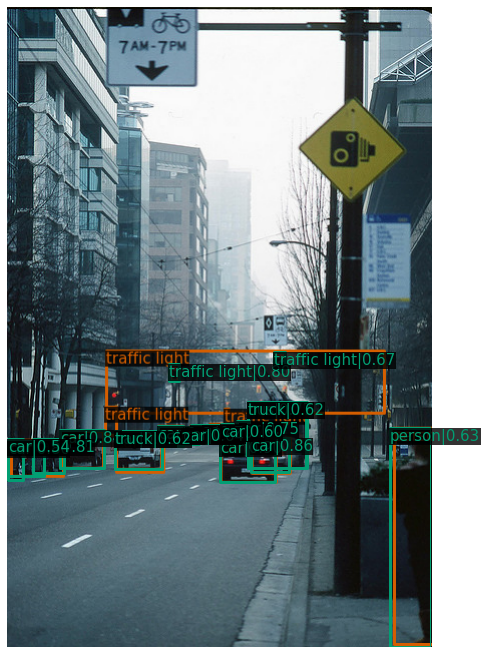

0.33179985533157985


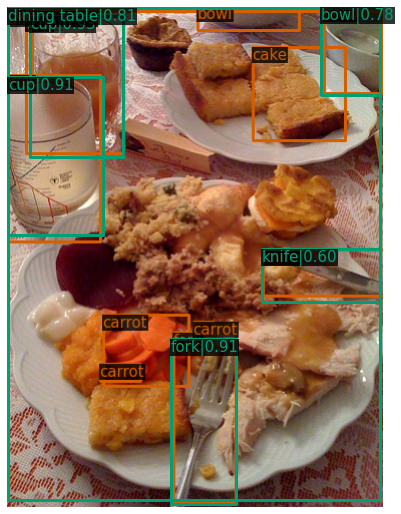

0.3497821047902107


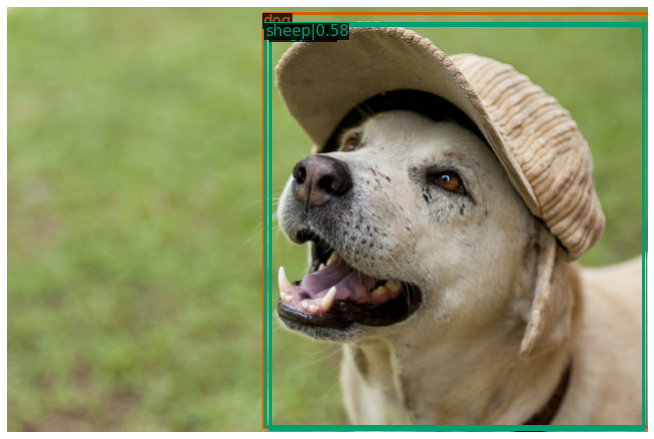

0.37199354966481524


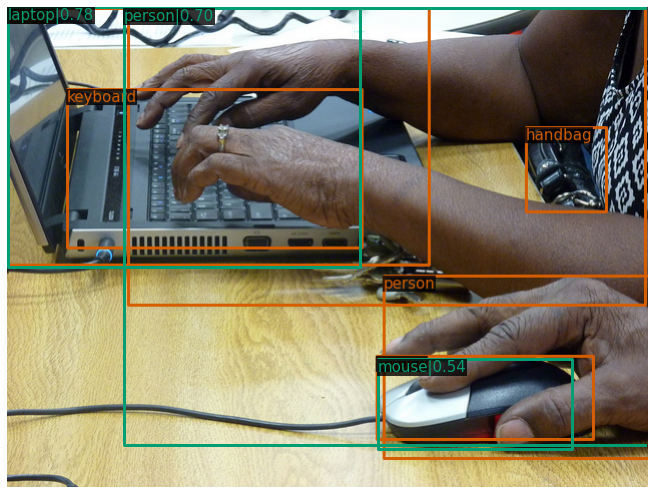

0.39704351045868613


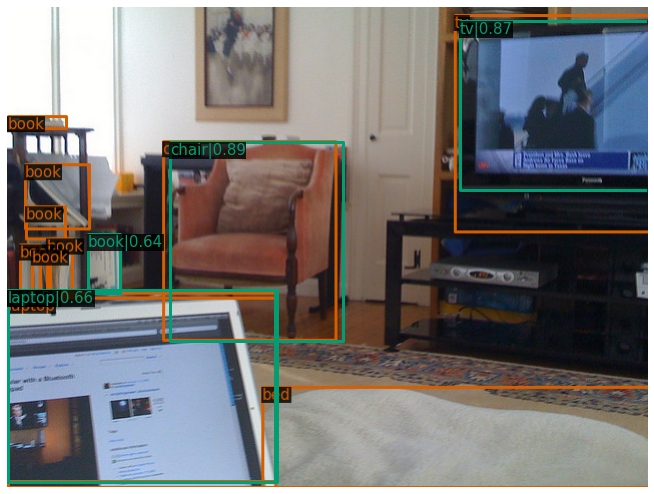

0.4215599578969619


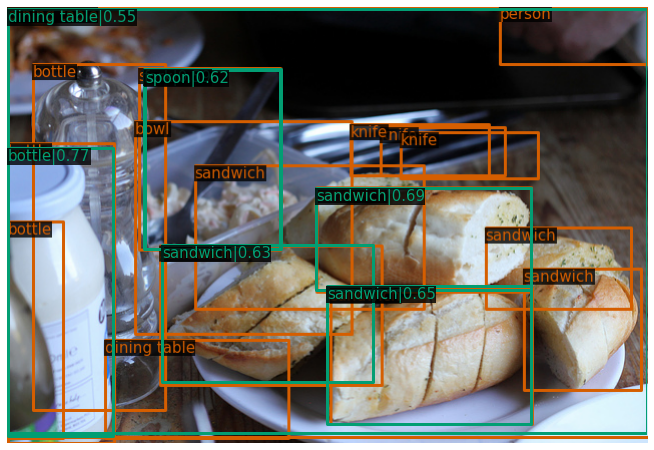

0.45513293462140214


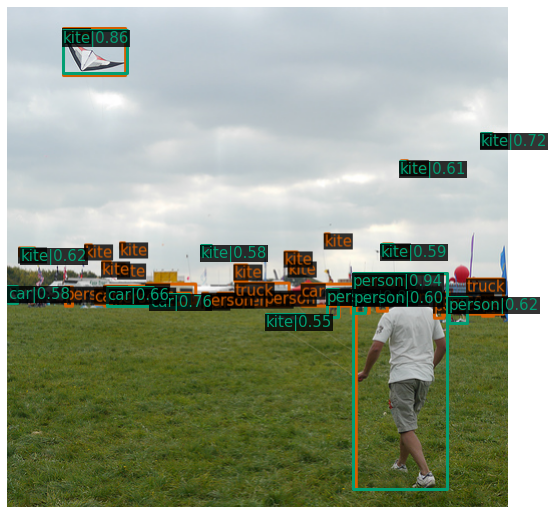

0.500113809960229


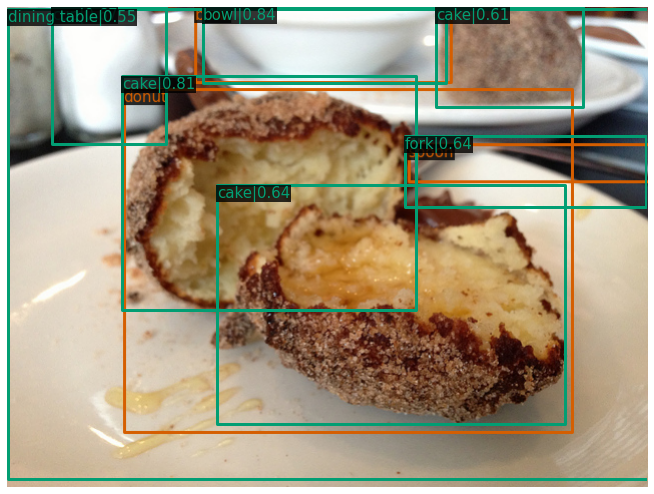

In [6]:
def cvrt_result(bbox_result):
    labels = [
        np.full(bbox.shape[0], i, dtype=np.int32)
        for i, bbox in enumerate(bbox_result)
    ]
    labels = np.concatenate(labels)
    bboxes = np.vstack(bbox_result)
    return bboxes, labels

cb_p = sns.color_palette("colorblind")
det_c = (np.asarray(cb_p[2])*255).astype(np.uint8)[::-1]
gt_c = (np.asarray(cb_p[3])*255).astype(np.uint8)[::-1]

sorted_idx = np.argsort([x[1] for x in c_costs["VFNet"]])

for s_idx in sorted_idx[::250]:
    dets = results["VFNet"][s_idx]
    img_name, cost = c_costs["VFNet"][s_idx]
    idx = dataset.img_ids.index(int(img_name[:-4]))
    data_info = dataset.prepare_train_img(idx)
    print(cost)
    im = imshow_gt_det_bboxes(
        data_info["img"], 
        data_info, 
        dets, 
        class_names=dataset.CLASSES, 
        det_bbox_color=det_c, 
        det_text_color=det_c,
        gt_bbox_color=gt_c, 
        gt_text_color=gt_c,
        thickness=3,
        font_size=15, 
        score_thr=0.0)
    plt.imsave(f"outputs/figs/detector_stability/examples/{cost}-{img_name}", im[:,:,::-1])